In [56]:
import warnings
warnings.filterwarnings("ignore")
from shapely.geometry import Polygon, Point, MultiLineString

In [2]:
import seaborn as sns
import mapclassify

In [3]:
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox

In [4]:
import overpass

In [5]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pysal.viz import mapclassify
from sklearn.neighbors import KDTree
import folium

plt.rcParams['figure.figsize'] = 15, 10
%matplotlib inline

/usr/local/lib/python3.6/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


In [6]:
nyc = gpd.read_file('data/new-york-city-boroughs.geojson')

In [7]:
nyc.head()

,name,cartodb_id,created_at,updated_at,geometry
0,Staten Island,1,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.05050799999999 40.566422, -74.0..."
1,Queens,2,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.83668299999999 40.594947, -73.8..."
2,Brooklyn,3,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.86706100000001 40.582088, -73.8..."
3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.01092800000001 40.684491, -74.0..."
4,Bronx,5,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.896809 40.795808, -73.896939 40..."


In [326]:
manhattan = nyc[nyc['name'] == 'Manhattan'].reset_index(drop=True)
api = overpass.API(endpoint="https://overpass.kumi.systems/api/interpreter")
response = api.get('node["name"="Empire State Building"]')
empire_state_building = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], crs={'init': 'epsg:4326'})

In [9]:
response = api.get('node["name"="Eiffel Tower"]')
eiffel_tower = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], crs={'init': 'epsg:4326'})

In [266]:
manhattan.contains(empire_state_building)

0    True
dtype: bool

In [267]:
manhattan.contains(eiffel_tower)

0    False
dtype: bool

In [268]:
gpd.sjoin(empire_state_building, nyc)

,geometry,index_right,name,cartodb_id,created_at,updated_at
0,POINT (-73.98499579999999 40.74816279999999),3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03


In [269]:
print(empire_state_building.crs, nyc.crs)

{'init': 'epsg:4326', 'no_defs': True} {'init': 'epsg:4326'}


In [327]:
manhattan = manhattan.to_crs(epsg='3857')
empire_state_building = empire_state_building.to_crs(epsg='3857')

In [328]:
empire_state_building

,geometry
0,POINT (-8235972.058798483 4975266.399617112)


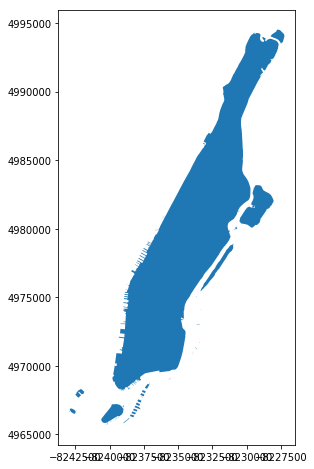

In [271]:
ax = manhattan.plot(figsize=(10, 8))

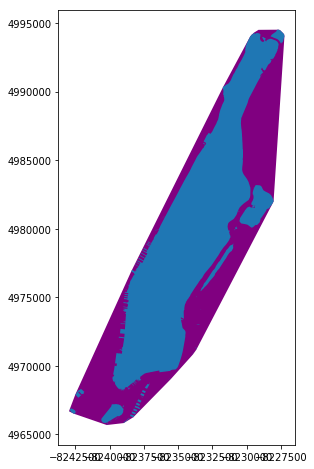

In [272]:
ax = manhattan.convex_hull.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

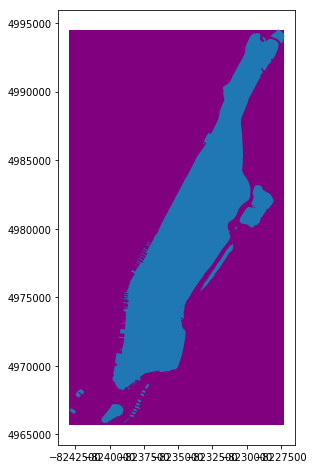

In [273]:
ax = manhattan.envelope.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

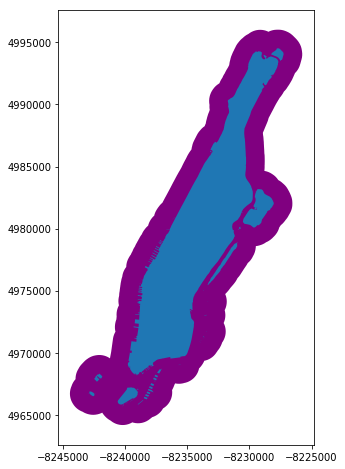

In [274]:
ax = manhattan.buffer(1500).plot(color='purple',  figsize=(10, 8))
ax = manhattan.plot(ax=ax)

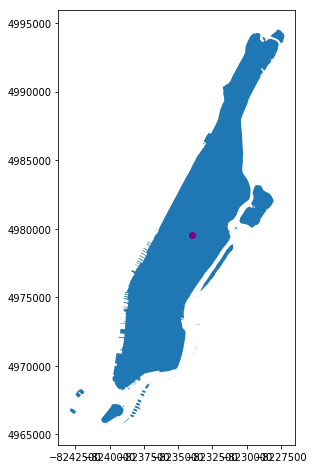

In [275]:
ax = manhattan.plot(figsize=(10, 8))
ax = manhattan.centroid.plot(ax=ax, color='purple')

In [20]:
es_buffer = empire_state_building.buffer(5000)

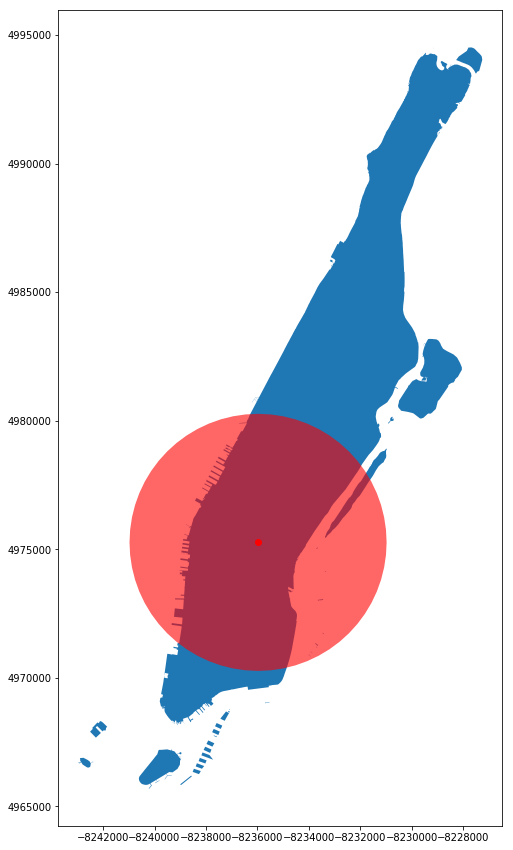

In [21]:
ax = manhattan.plot(figsize=(10, 15))
ax = es_buffer.plot(color='r', ax=ax, alpha=0.6)
ax = empire_state_building.plot(ax=ax, color='r')

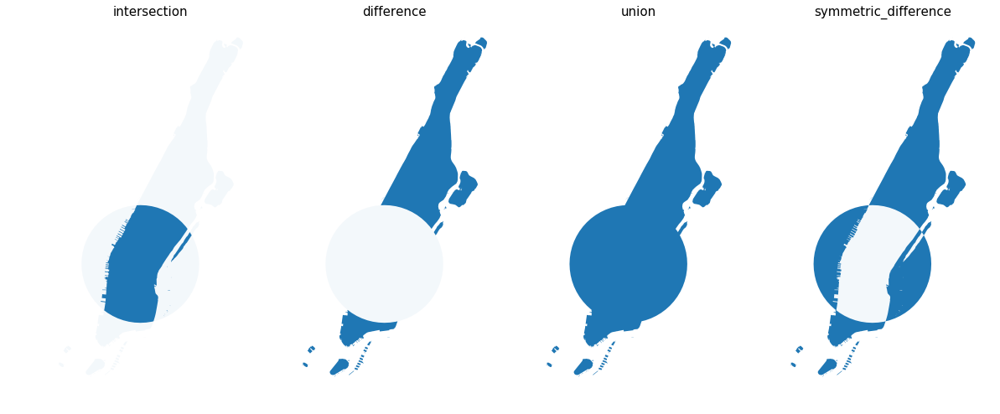

In [22]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20))

polys = [manhattan.intersection(es_buffer),
manhattan.difference(es_buffer),
manhattan.union(es_buffer),
manhattan.symmetric_difference(es_buffer)]

titles = ['intersection', 'difference', 'union', 'symmetric_difference']

for x, ax in enumerate(axes.flatten()):
    ax = manhattan.union(es_buffer).plot(alpha=0.05, ax=ax)
    ax = polys[x].plot(ax=ax)
    ax.set_title(titles[x], size=15)
    ax.axis('off')

plt.show()

In [23]:
manhattan = manhattan.to_crs(epsg='4326')
empire_state_building = empire_state_building.to_crs(epsg='4326')

In [310]:
%%time
df = pd.read_csv('data/train_2015.csv')
#df = df[df['dropoff_longitude'] > 0].reset_index(drop=True)

CPU times: user 11.9 s, sys: 1.84 s, total: 13.8 s
Wall time: 15.6 s


In [311]:
df =df[df['dropoff_longitude'] != 0].reset_index(drop=True)

In [312]:
df.shape

(2892285, 19)

In [27]:
gdf = df[:1000000]
gdf = gpd.GeoDataFrame(gdf,
                       geometry=[Point(x,y) for x,y in zip(gdf['dropoff_longitude'], gdf['dropoff_latitude'])])
xy = gdf['geometry'].map(lambda point: point.xy)
x,y = zip(*xy)

In [45]:
lon_min = -74.103095
lat_min = 40.597399
lon_max = -73.729243
lat_max = 40.906114

CPU times: user 57.7 s, sys: 1.56 s, total: 59.2 s
Wall time: 1min 6s


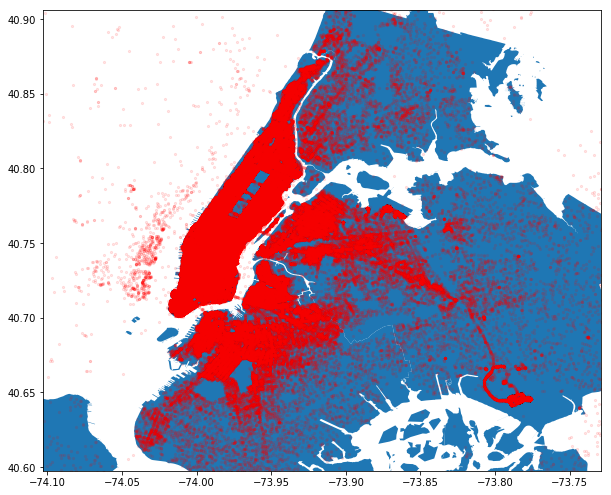

In [51]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax = gdf.plot(ax=ax, color='red', markersize=5, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

CPU times: user 17.4 s, sys: 342 ms, total: 17.7 s
Wall time: 18.7 s


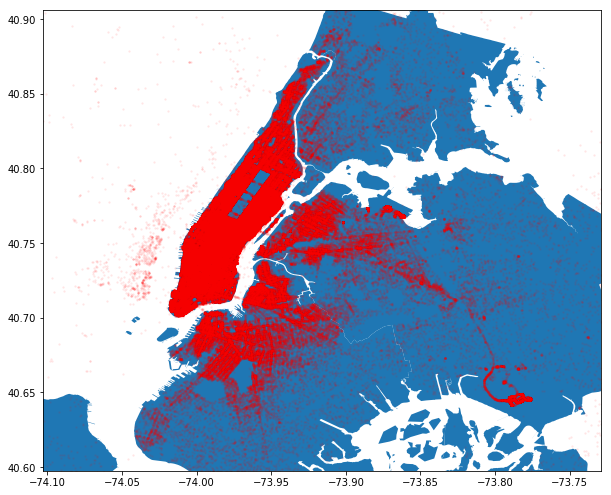

In [52]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax.scatter(x, y, s=5, color='red', linewidth=0, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

In [53]:
m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

In [276]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

df['pickup_latitude'] = df['pickup_latitude'].astype(float)
df['pickup_longitude'] = df['pickup_longitude'].astype(float)

df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:20000]
df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
heat_data = [[row['pickup_latitude'],row['pickup_longitude']] for index, row in df_for_heatmap.iterrows()]
# Plot it on the map
HeatMap(heat_data,
        radius=10).add_to(m)
# Display the map
m

In [55]:
zones = gpd.read_file('data/taxi_zones.geojson')

In [33]:
zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...


In [313]:
%%time
df = gpd.GeoDataFrame(df, geometry=[Point(x,y) for x,y in zip(df['dropoff_longitude'], df['dropoff_latitude'])])

CPU times: user 35.7 s, sys: 6.14 s, total: 41.9 s
Wall time: 45.4 s


In [57]:
%%time
joined = gpd.sjoin(df, zones)

CPU times: user 4min 36s, sys: 9.37 s, total: 4min 45s
Wall time: 5min 1s


In [58]:
%%time
joined = gpd.sjoin(df, zones, op='within')

CPU times: user 2min 18s, sys: 6.17 s, total: 2min 24s
Wall time: 2min 27s


In [59]:
counts = joined[['zone', 'index_right']].groupby('zone').count().reset_index().rename(columns={
    'index_right':'trip_count'})
zones = pd.merge(zones, counts, on='zone')

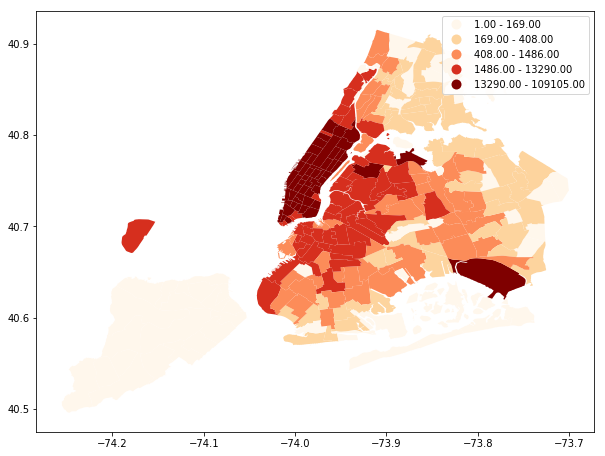

In [60]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='quantiles',
           legend=True)

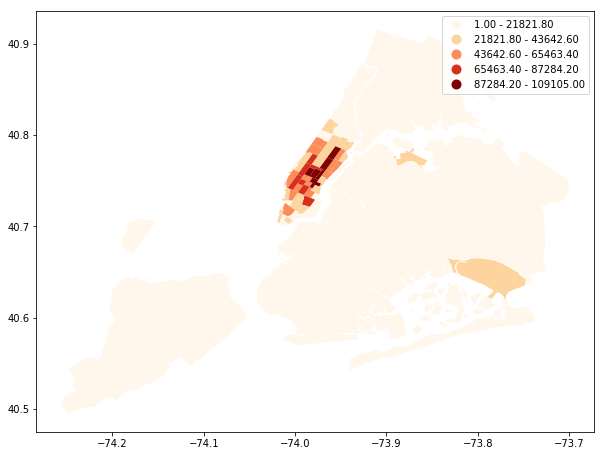

In [61]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='equal_interval',
           legend=True)

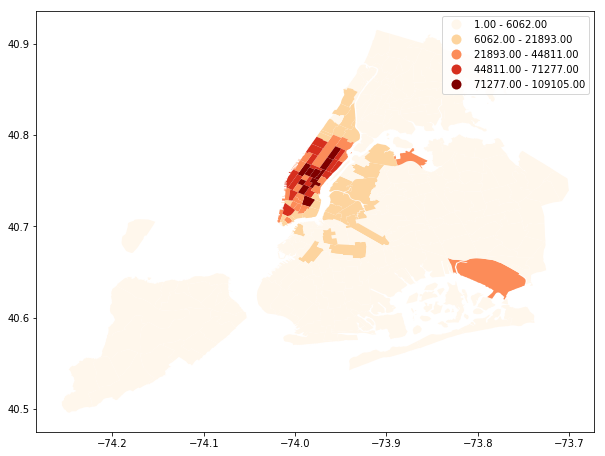

In [62]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='fisher_jenks',
           legend=True)

In [63]:
zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,trip_count
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18...",4673
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...,2


In [64]:
#zones.to_file('please.geojson', driver='GeoJSON')

In [65]:
#zones = gpd.read_file('please.geojson')

In [277]:
bins = 5

district_stats_pd = zones.drop(labels='geometry', axis=1)

l = folium.Map(location=[40.730610, -73.935242], 
               zoom_start=11,
               tiles = "CartoDB positron")

folium.Choropleth(
    geo_data=zones,
    data=district_stats_pd,
    columns=['zone','trip_count'],
    key_on = 'feature.properties.zone',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=bins,
    legend_name='Trip Count'
).add_to(l)

l

In [81]:
import osmnx as ox
ox.config(log_console=True, use_cache=True)
ox.__version__

'0.10'

In [82]:
%%time
G = ox.graph_from_bbox(lat_max, lat_min, lon_max, lon_min,
                        network_type='drive')

CPU times: user 1min 22s, sys: 3.04 s, total: 1min 26s
Wall time: 1min 37s


In [ ]:
#G = ox.project_graph(G)

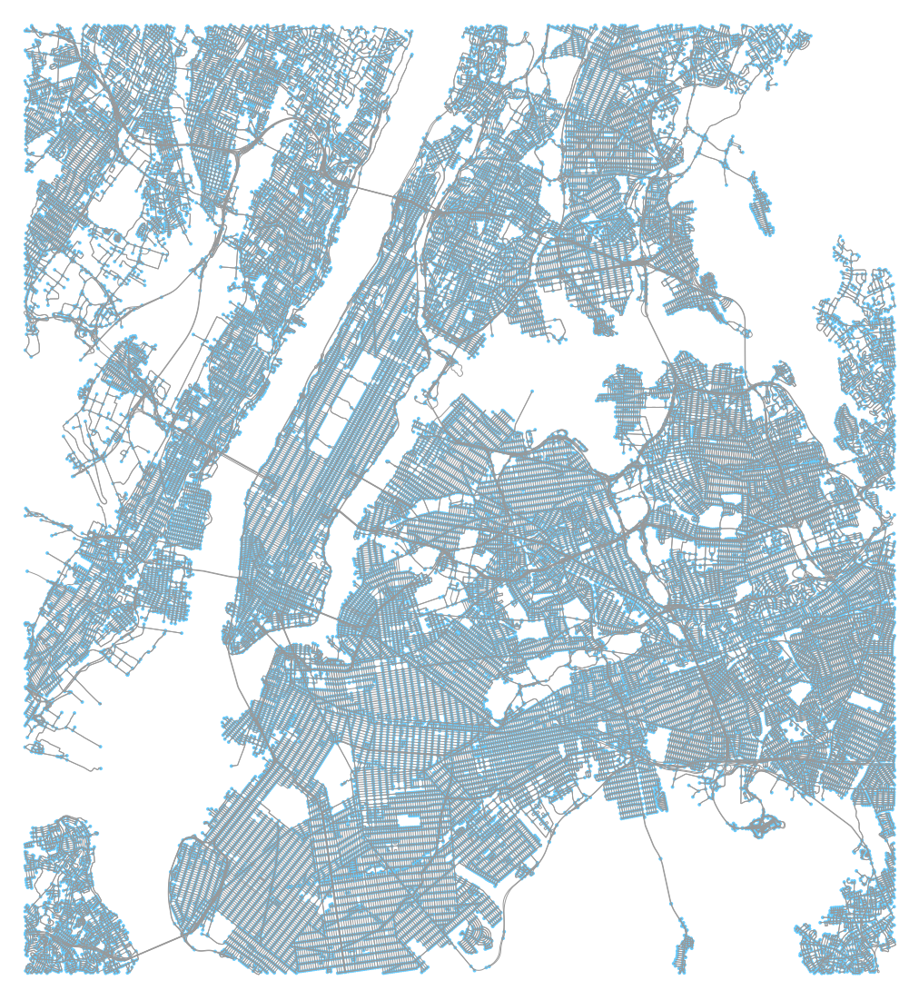

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cd4a3898>)

In [83]:
ox.plot_graph(G, fig_height=20, fig_width=20)

In [84]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)

In [106]:
gdf_nodes.tail(5)

,highway,osmid,ref,x,y,geometry
42729464,NaN,42729464,NaN,-73.906448,40.901035,POINT (-73.9064482 40.9010349)
42467323,traffic_signals,42467323,NaN,-73.937518,40.654916,POINT (-73.937518 40.654916)
42467324,traffic_signals,42467324,NaN,-73.936548,40.654976,POINT (-73.936548 40.654976)
42467325,traffic_signals,42467325,NaN,-73.935578,40.655039,POINT (-73.93557800000001 40.655039)
42860543,NaN,42860543,NaN,-73.941771,40.743831,POINT (-73.9417706 40.7438315)


In [113]:
len(df)

2892285

In [ ]:
tree = KDTree(gdf_nodes[['y', 'x']], metric='euclidean')

In [104]:
def find_nearest_node(tree, gdf, point):
    
    closest_idx = tree.query([(point.y, point.x)], k=1, return_distance=False)[0]
    nearest_node = gdf.iloc[closest_idx].index.values[0]
    
    return nearest_node

In [118]:
closest_node_to_es = find_nearest_node(tree, gdf_nodes, empire_state_building['geometry'][0])

In [126]:
closest_node_to_es

42446701

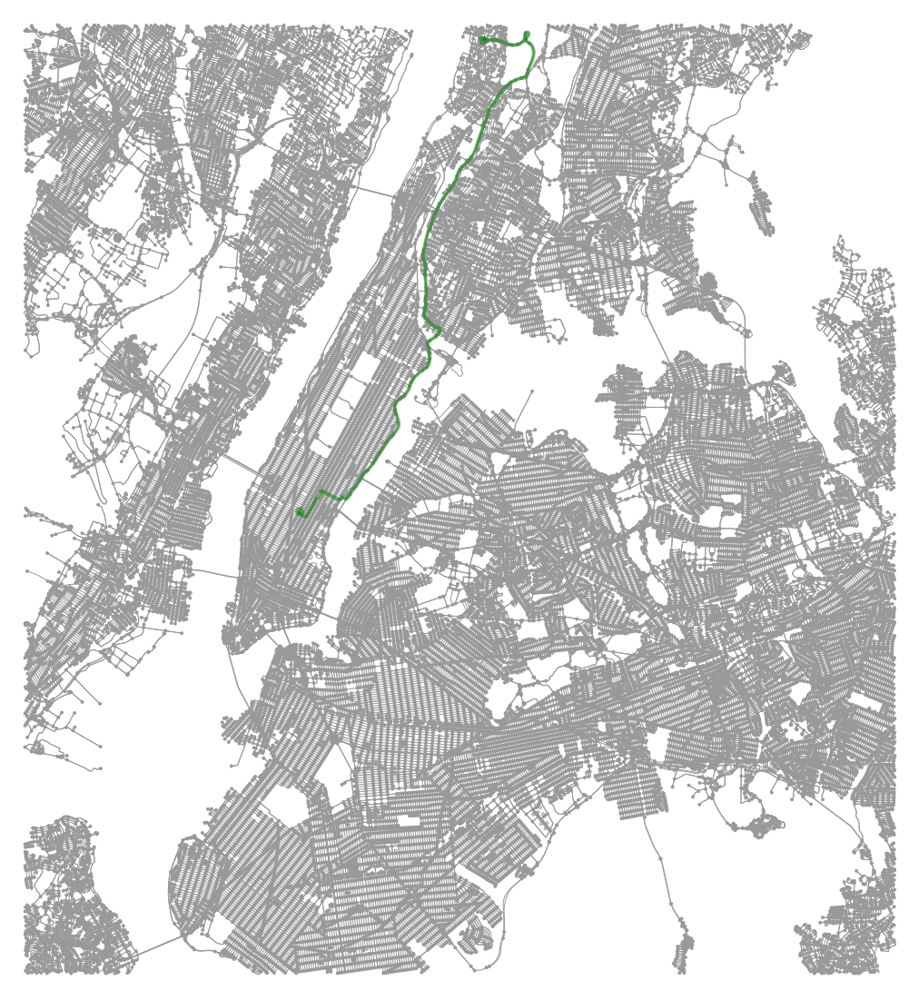

In [120]:
route = nx.shortest_path(G, closest_node_to_es, 42729464)

fig, ax = ox.plot_graph_route(G, route,
                              show=False, close=False, 
                              orig_dest_node_color='green',
                              route_color='green',
                              fig_height=20,
                              fig_width=20)

plt.show()

In [90]:
m = ox.plot_route_folium(G, 
                         route, 
                         route_color='green', route_opacity=0.7, route_width=3)
m

In [91]:
route[:5]

[42446701, 42443680, 42445899, 4597668020, 42449308]

In [92]:
ox.node_list_to_coordinate_lines(G, route)[:5]

[[(-73.985046, 40.747773), (-73.9854922, 40.747168)],
 [(-73.9854922, 40.747168),
  (-73.9851684, 40.7470315),
  (-73.9840491, 40.7465597),
  (-73.9838963, 40.7464898)],
 [(-73.9838963, 40.7464898),
  (-73.9838009, 40.7464499),
  (-73.9823187, 40.7458297)],
 [(-73.9823187, 40.7458297), (-73.9822164, 40.7457862)],
 [(-73.9822164, 40.7457862),
  (-73.9820664, 40.7459924),
  (-73.9818111, 40.7463434),
  (-73.9817748, 40.7464005)]]

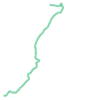

In [93]:
MultiLineString(ox.node_list_to_coordinate_lines(G, route))

In [286]:
len(df_subset)

10000

In [329]:
es_buffer = empire_state_building.buffer(100)

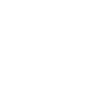

In [330]:
gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0]

In [331]:
%%time
matches = df.intersects(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0])
matches = df[matches]

CPU times: user 24.1 s, sys: 917 ms, total: 25 s
Wall time: 34 s


In [332]:
%%time
sindex = df.sindex

CPU times: user 14 µs, sys: 1e+03 ns, total: 15 µs
Wall time: 19.1 µs


In [333]:
%%time
possible_matches_index = list(sindex.intersection(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0].bounds))
possible_matches = df.iloc[possible_matches_index]
precise_matches = possible_matches[possible_matches.intersects(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0])]

CPU times: user 935 ms, sys: 125 ms, total: 1.06 s
Wall time: 1.24 s


In [334]:
%%time
sjoin_matches = gpd.sjoin(df, gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326))

CPU times: user 2min 43s, sys: 7.37 s, total: 2min 50s
Wall time: 3min 11s


In [341]:
%%time
sjoin_matches = gpd.sjoin(df, gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326))

CPU times: user 2min 28s, sys: 3.54 s, total: 2min 31s
Wall time: 2min 40s


In [338]:
len(matches)

4799

In [353]:
precise_matches.head(2)

,RateCodeID,VendorID,dropoff_latitude,dropoff_longitude,extra,fare_amount,improvement_surcharge,mta_tax,passenger_count,payment_type,pickup_latitude,pickup_longitude,store_and_fwd_flag,tip_amount,tolls_amount,total_amount,tpep_dropoff_datetime,tpep_pickup_datetime,trip_distance,geometry
637092,1.0,2,40.748772,-73.984802,1.0,7.0,0.3,0.5,1,1,40.750614,-73.971825,N,1.76,0.0,10.56,2015-03-10 19:57:04,2015-03-10 19:47:59,0.94,POINT (-73.98480224609375 40.74877166748047)
594389,1.0,1,40.748775,-73.984879,0.0,3.5,0.3,0.5,1,2,40.752415,-73.981598,N,0.00,0.0,4.30,2015-03-23 10:48:42,2015-03-23 10:46:30,0.20,POINT (-73.98487854003906 40.74877548217773)


In [354]:
manhattan

,name,cartodb_id,created_at,updated_at,geometry
0,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03,(POLYGON ((-8238858.818097634 4965914.95502375...


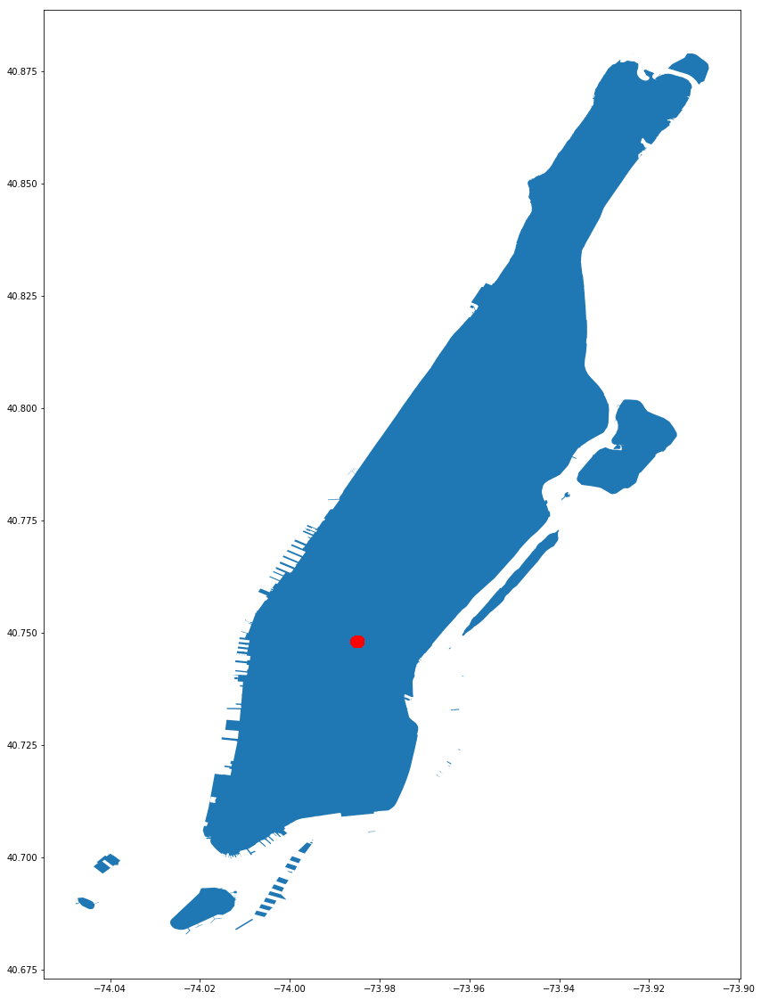

In [357]:
ax = manhattan.to_crs(epsg=4326).plot(figsize=(20,20))
ax = precise_matches.plot(ax = ax, c='red')

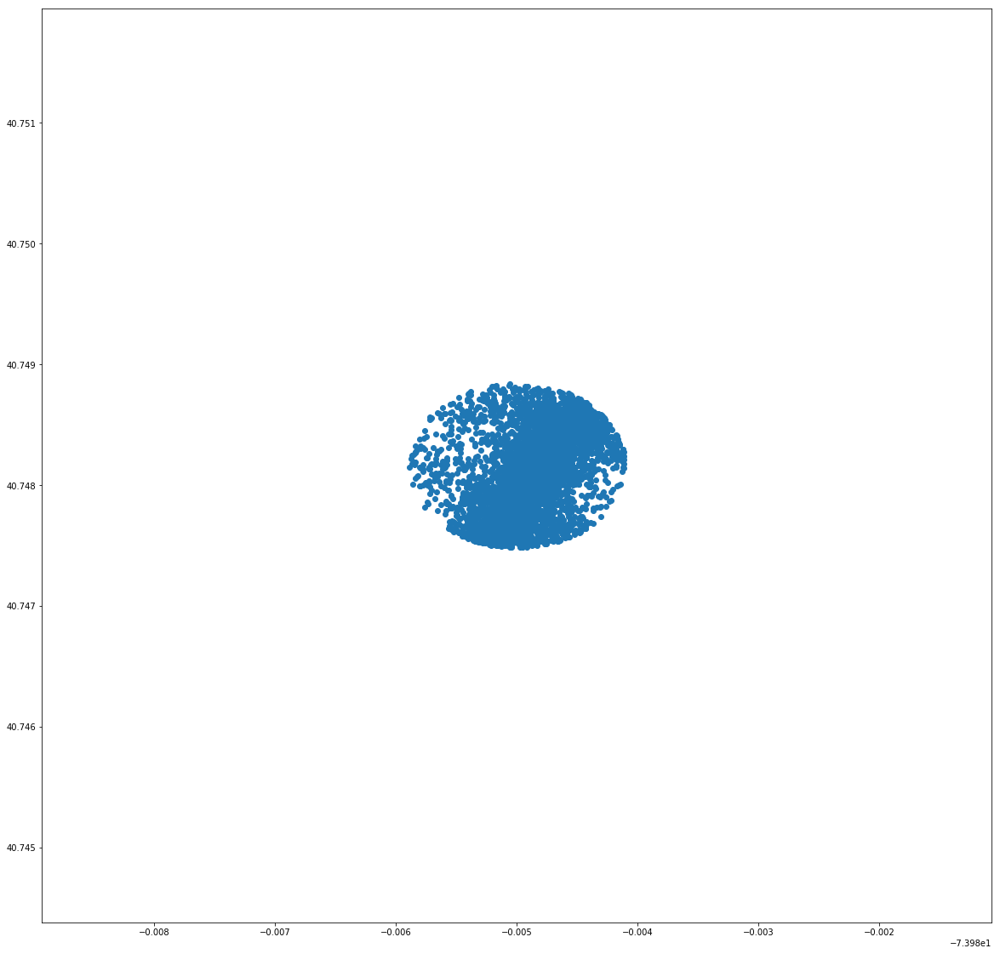

In [348]:
precise_matches.plot(figsize=(20,20))

In [347]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

#df['pickup_latitude'] = df['pickup_latitude'].astype(float)
#df['pickup_longitude'] = df['pickup_longitude'].astype(float)

#df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:20000]
#df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
folium.GeoJson(precise_matches.to_json()).add_to(m)
# Display the map
m

In [340]:
len(sjoin_matches)

4799

In [303]:
precise_matches.head(2)

,RateCodeID,VendorID,dropoff_latitude,dropoff_longitude,extra,fare_amount,improvement_surcharge,mta_tax,passenger_count,payment_type,pickup_latitude,pickup_longitude,store_and_fwd_flag,tip_amount,tolls_amount,total_amount,tpep_dropoff_datetime,tpep_pickup_datetime,trip_distance,geometry
1700162,1.0,1,40.768787,-73.961250,0.0,16.5,0.3,0.5,1,1,40.751255,-73.994156,N,1.7,0.0,19.0,2015-07-11 15:28:43,2015-07-11 15:05:26,2.90,POINT (-73.96125030517578 40.7687873840332)
1212233,1.0,2,40.768795,-73.961205,1.0,27.0,0.3,0.5,1,2,40.733929,-73.990829,N,0.0,0.0,28.8,2015-05-14 18:26:45,2015-05-14 17:39:40,3.28,POINT (-73.96120452880859 40.76879501342773)


In [358]:
precise_matches['closest_to_pickup_node'] = [find_nearest_node(
    tree, gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['pickup_longitude'], precise_matches['pickup_latitude'])]
precise_matches['closest_to_dropoff_node'] = [find_nearest_node(
    tree, gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['dropoff_longitude'], precise_matches['dropoff_latitude'])]

In [359]:
precise_matches.head(2)

,RateCodeID,VendorID,dropoff_latitude,dropoff_longitude,extra,fare_amount,improvement_surcharge,mta_tax,passenger_count,payment_type,...,store_and_fwd_flag,tip_amount,tolls_amount,total_amount,tpep_dropoff_datetime,tpep_pickup_datetime,trip_distance,geometry,closest_to_pickup_node,closest_to_dropoff_node
637092,1.0,2,40.748772,-73.984802,1.0,7.0,0.3,0.5,1,1,...,N,1.76,0.0,10.56,2015-03-10 19:57:04,2015-03-10 19:47:59,0.94,POINT (-73.98480224609375 40.74877166748047),42442939,42437644
594389,1.0,1,40.748775,-73.984879,0.0,3.5,0.3,0.5,1,2,...,N,0.00,0.0,4.30,2015-03-23 10:48:42,2015-03-23 10:46:30,0.20,POINT (-73.98487854003906 40.74877548217773),42446488,42437644


In [360]:
from tqdm import tqdm_notebook as tqdm

In [240]:
manhattan.centroid[0].x

-73.96716037039859

In [361]:
routes = []

for row in tqdm(precise_matches.iterrows()):
    try:
        route = nx.shortest_path(G, row[1].closest_to_pickup_node, row[1].closest_to_dropoff_node)
        routes.append(MultiLineString(ox.node_list_to_coordinate_lines(G, route)))
    except:
        routes.append(Point(manhattan.centroid[0].x, manhattan.centroid[0].y))

In [364]:
precise_matches['geometry'] = routes

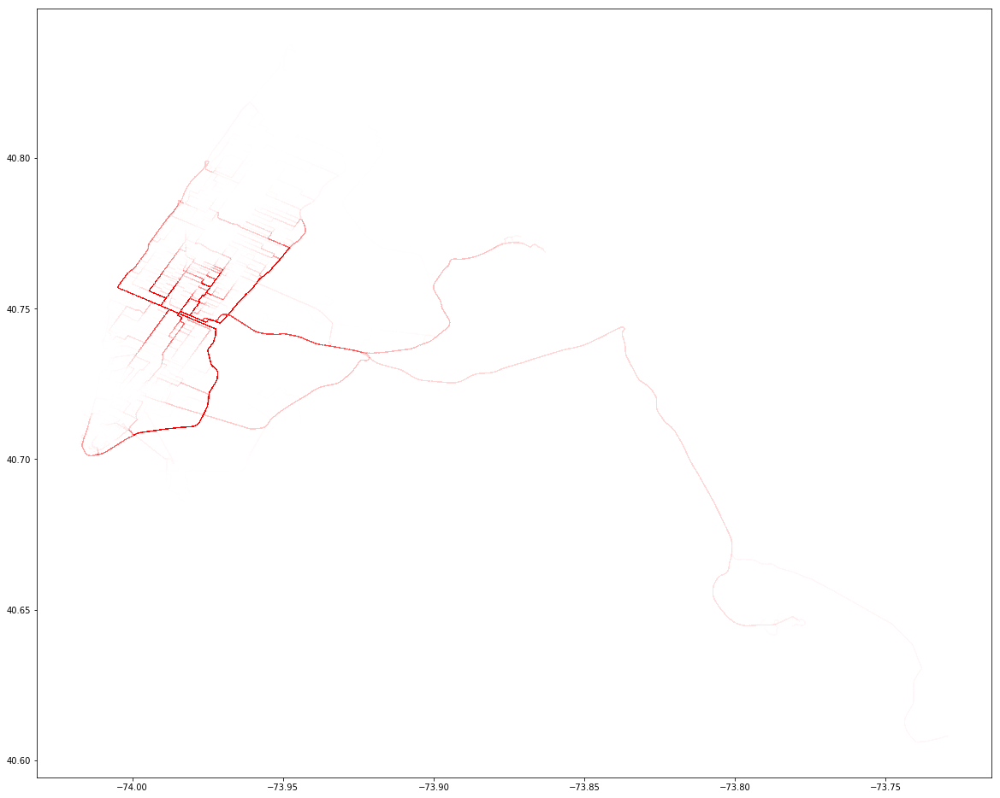

In [365]:
precise_matches.plot(figsize=(20, 25), color='red', alpha=0.005)

In [ ]:
df.head(2)

In [ ]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

df['pickup_latitude'] = df['pickup_latitude'].astype(float)
df['pickup_longitude'] = df['pickup_longitude'].astype(float)

df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:10000]
df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
heat_data = [[row['pickup_latitude'],row['pickup_longitude']] for index, row in df_for_heatmap.iterrows()]
# Plot it on the map
HeatMap(heat_data,
        radius=10).add_to(m)
# Display the map
m

In [257]:
m = folium.Map(location=[40.730610, -73.935242], zoom_start=12, tiles='cartodbpositron')

folium.GeoJson(df_subset[:300].to_json(), style_function=lambda x: {'color': 'red',
                                                                    'opacity':'0.2',
                                                                    'weight':'1.5'}).add_to(m)

m